# Libraries

In [ ]:
!pip3 install yfinance --quiet
!pip3 install stockstats --quiet

     |████████████████████████████████| 6.4 MB 37.1 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import yfinance as yf
from math import floor
from functools import reduce
import matplotlib.pyplot as plt
from termcolor import colored as cl
from stockstats import StockDataFrame

plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (20, 10)

# Data

In [ ]:
'''
# For Non NaN values starting the date from 2017-11-17 (to remove NaN from SBILIFE and HDFCLIFE stocks)
# End date can be set to 2022-03-31
# Start date can be set to 2018-04-01 to make exactly 4 Fiscal Years as the data
'''

'\n# For Non NaN values starting the date from 2017-11-17 (to remove NaN from SBILIFE and HDFCLIFE stocks)\n# End date can be set to 2022-03-31\n# Start date can be set to 2018-04-01 to make exactly 4 Fiscal Years as the data\n'

In [ ]:
!gdown --id 11H7EfY9ibcljk5o0NJt58IHw1BhxnAO6 # nifty50 tickers.csv

In [ ]:
# YYYY-MM-DD, taking 4 FYs
start_date = '2018-04-01'
end_date = '2022-03-31'

# Stock Symbols
symbols = pd.read_csv('/content/nifty50 tickers.csv', header = None)
symbols_daily = symbols + '_daily'
symbols_daily = list(symbols_daily[0])
symbols = list(symbols[0])

In [ ]:
# downloading historical data from yahoo finance
def get_historical_data(sym, start_date=start_date, end_date=end_date):
  # print("Stock: ", sym)
  stock_symbol = yf.Ticker(sym)
  df = stock_symbol.history(start = start_date, end = end_date, interval='1d')
  df = df[['Open', 'High', 'Low', 'Close']]
  
  return df

In [ ]:
for i in range(len(symbols)):
  symbols_daily[i], symbols_daily[i].name = get_historical_data(symbols[i]).dropna(), symbols[i]

In [ ]:
ClosePrice = pd.DataFrame(columns=(symbols))
for i in range(len(symbols)):
    ClosePrice[symbols[i]] = symbols_daily[i]['Close']

In [ ]:
# ClosePrice

In [ ]:
# symbols_daily

In [ ]:
Stocks_Daily = [StockDataFrame.retype(item) for item in symbols_daily]
Stocks_Indicator = [StockDataFrame(item) for item in Stocks_Daily]

In [ ]:
strategy = 'LSTM' # change the strategy between LR, SVR, LSTM
test_size = '2' # test size from [2, 4, 6, 8, 10] but for plotting purpose

In [ ]:
# top idxs from different models for different test sizes

# !gdown --id 1U92btqjh1ScRzyAnwIX59JX5-eV1F9Lm # LR/10/top_idxs.npy
# !gdown --id 1WY9cb_jEWZdt2kbCMSEnBpEGi-GDQbX0 # SVR/10/top_idxs.npy
# !gdown --id 1VrnWVvVvvbZoE_GolgakHMiobJhSoVQF # LSTM_window_5/10/top_idxs.npy

# !gdown --id 197ND1lX50FQ0WMkttA7wQuZ9rUZFI_a1 # LR/6/top_idxs.npy
# !gdown --id 1fRDKYG9BgndinZyuxWVFF7D8tAgxGmF2 # SVR/6/top_idxs.npy
# !gdown --id 1ztwuSTOUjrpWFETF0Mx9GEpMaH7hi-4n # LSTM_window_5/6/top_idxs.npy

# !gdown --id 1k6Y85A-Y-SiCZubJujvQipIuvbfBFHng # LR/2/top_idxs.npy
# !gdown --id 1iYG1LEPIC_5Oqx5a_FApBCvfPvF9zNIj # SVR/2/top_idxs.npy
!gdown --id 1RAog0ntrrSWKWcIpnlebqFU7CrJsrp1A # LSTM_window_5/2/top_idxs.npy

picked_stocks = np.sort(np.load('/content/top_idxs.npy'))

# MAC Rule using StockStats

In [ ]:
plt.rcParams['figure.figsize'] = (20, 10)
plt.style.use('fivethirtyeight')

In [ ]:
output_path_MAC = strategy + '_' + test_size + '/MAC'

# Make experiment directory #
if not os.path.exists(output_path_MAC):
        os.makedirs(output_path_MAC)

In [ ]:
def implement_mac_strategy(prices, data):    
    buy_price = []
    sell_price = []
    mac_signal = []
    signal = 0

    for i in range(len(data)):
        if data['close_20_sma'][i] > data['close_50_sma'][i]:
            if signal != 1:
                buy_price.append(prices[i])
                sell_price.append(np.nan)
                signal = 1
                mac_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                mac_signal.append(0)
        elif data['close_20_sma'][i] < data['close_50_sma'][i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(prices[i])
                signal = -1
                mac_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                mac_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            mac_signal.append(0)
            
    return buy_price, sell_price, mac_signal

def mac_signal_plot(df, label_):
  # df_macd = get_macd(df['close'], 26, 12, 9) # get macd and signal line values
  buy_price, sell_price, mac_signal = implement_mac_strategy(df['close'], df) # gets signal for buy and sell

  ax1 = plt.subplot2grid((14,1), (0,0), rowspan = 7, colspan = 1)
  ax2 = plt.subplot2grid((15,1), (9,0), rowspan = 6, colspan = 1)
  
  ax1.plot(df['close'], color = 'skyblue', linewidth = 2, label = label_)
  ax1.plot(df.index, buy_price, marker = '^', color = 'green', markersize = 10, label = 'BUY SIGNAL', linewidth = 0)
  ax1.plot(df.index, sell_price, marker = 'v', color = 'r', markersize = 10, label = 'SELL SIGNAL', linewidth = 0)
  ax1.legend()
  ax1.set_title(label_ + ' MAC(20, 50) SIGNALS')
  ax2.plot(df['close_20_sma'], color = 'grey', linewidth = 1.5, label = 'SMA(20)')
  ax2.plot(df['close_50_sma'], color = 'skyblue', linewidth = 1.5, label = 'SMA(50)')
          
  plt.legend(loc = 'lower right')
  # plt.show()
  plt.savefig(os.path.join(output_path_MAC, label_ + '.png'))

In [ ]:
def run_all_MAC(df, sym_):
  buy_price, sell_price, mac_signal = implement_mac_strategy(df['close'], df) # gets signal for buy and sell
  mac_signal_plot(df, sym_)

  position = []
  for i in range(len(mac_signal)):
      if mac_signal[i] > 1:
          position.append(0)
      else:
          position.append(1)
          
  for i in range(len(df['close'])):
      if mac_signal[i] == 1:
          position[i] = 1
      elif mac_signal[i] == -1:
          position[i] = 0
      else:
          position[i] = position[i-1]
          
  close_20sma = df['close_20_sma']
  close_50sma = df['close_50_sma']
  close_price = df['close']
  mac_signal = pd.DataFrame(mac_signal).rename(columns = {0:'mac_signal'}).set_index(df.index)
  position = pd.DataFrame(position).rename(columns = {0:'mac_position'}).set_index(df.index)

  frames = [close_price, close_20sma, close_50sma, mac_signal, position]
  strategy = pd.concat(frames, join = 'inner', axis = 1)


  # backtesting on investment amount
  df_ret = pd.DataFrame(np.diff(df['close'])).rename(columns = {0:'returns'})
  mac_strategy_ret = []

  for i in range(len(df_ret)):
      try:
          returns = df_ret['returns'][i]*strategy['mac_position'][i]
          mac_strategy_ret.append(returns)
      except:
          pass
      
  mac_strategy_ret_df = pd.DataFrame(mac_strategy_ret).rename(columns = {0:'mac_returns'})

  investment_value = 100_000
  number_of_stocks = floor(investment_value/df['close'][0])
  mac_investment_ret = []

  for i in range(len(mac_strategy_ret_df['mac_returns'])):
      returns = number_of_stocks*mac_strategy_ret_df['mac_returns'][i]
      mac_investment_ret.append(returns)

  mac_investment_ret_df = pd.DataFrame(mac_investment_ret).rename(columns = {0:'investment_returns'})
  total_investment_ret = round(sum(mac_investment_ret_df['investment_returns']), 2)
  profit_percentage = floor((total_investment_ret/investment_value)*100)

  with open(os.path.join(output_path_MAC, sym_ + '_MAC.txt'), 'w') as f:
    f.write('Profit gained from the MAC strategy by investing $100k in ' + sym_ + ' : ' + str(total_investment_ret))
    f.write('\n Profit percentage of the MAC strategy for ' + sym_ + ' : ' + str(profit_percentage) + '%')
  
  print(sym_)

ONGC.NS
UPL.NS
ITC.NS
IOC.NS
SBIN.NS
NTPC.NS
COALINDIA.NS
INDUSINDBK.NS
RELIANCE.NS
TATAMOTORS.NS


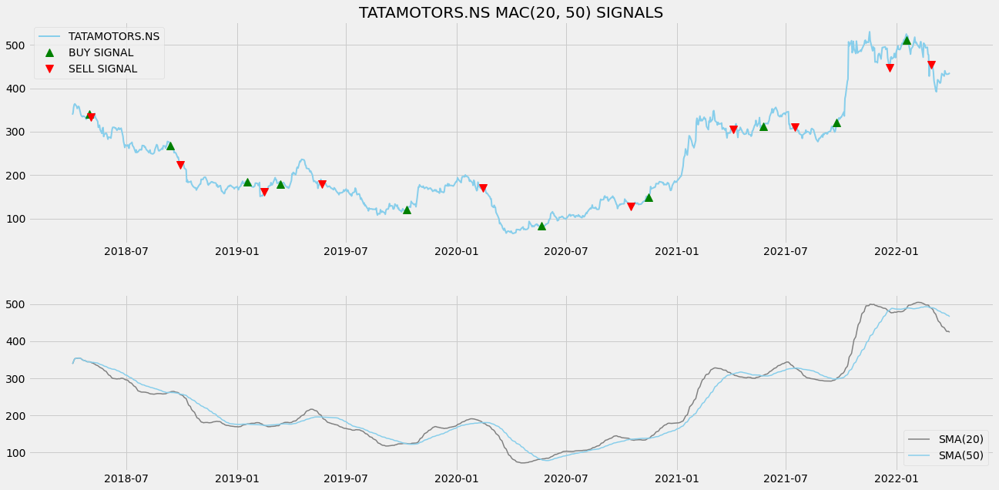

In [ ]:
# First get the list of picked_stocks

for i in picked_stocks:
  run_all_MAC(Stocks_Indicator[i], symbols[i])

# MACD Rule

## MACD on Stock Price

In [ ]:
output_path_MACD = strategy + '_' + test_size + '/MACD'

# Make experiment directory #
if not os.path.exists(output_path_MACD):
        os.makedirs(output_path_MACD)

In [ ]:
plt.rcParams['figure.figsize'] = (20, 10)
plt.style.use('fivethirtyeight')

In [ ]:
def get_macd(price, slow, fast, smooth):
    exp1 = price.ewm(span = fast, adjust = False).mean()
    exp2 = price.ewm(span = slow, adjust = False).mean()
    macd = pd.DataFrame(exp1 - exp2).rename(columns = {'close':'macd'})
    signal = pd.DataFrame(macd.ewm(span = smooth, adjust = False).mean()).rename(columns = {'macd':'signal'})
    hist = pd.DataFrame(macd['macd'] - signal['signal']).rename(columns = {0:'hist'})
    frames =  [macd, signal, hist]
    df = pd.concat(frames, join = 'inner', axis = 1)
    return df

def plot_macd(prices, macd, signal, hist):
    ax1 = plt.subplot2grid((14,1), (0,0), rowspan = 7, colspan = 1)
    ax2 = plt.subplot2grid((15,1), (9,0), rowspan = 6, colspan = 1)

    ax1.plot(prices)
    ax2.plot(macd, color = 'grey', linewidth = 1.5, label = 'MACD')
    ax2.plot(signal, color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')

    for i in range(len(prices)):
        if str(hist[i])[0] == '-':
            ax2.bar(prices.index[i], hist[i], color = '#ef5350')
        else:
            ax2.bar(prices.index[i], hist[i], color = '#26a69a')

    plt.legend(loc = 'lower right')

def implement_macd_strategy(prices, data):    
    buy_price = []
    sell_price = []
    macd_signal = []
    signal = 0

    for i in range(len(data)):
        if data['macd'][i] > data['signal'][i]:
            if signal != 1:
                buy_price.append(prices[i])
                sell_price.append(np.nan)
                signal = 1
                macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                macd_signal.append(0)
        elif data['macd'][i] < data['signal'][i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(prices[i])
                signal = -1
                macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                macd_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            macd_signal.append(0)
            
    return buy_price, sell_price, macd_signal

def macd_signal_plot(df, label_, output_path, short = 12, long = 26, signal = 9):
  df_macd = get_macd(df['close'], 26, 12, 9) # get macd and signal line values
  buy_price, sell_price, macd_signal = implement_macd_strategy(df['close'], df_macd) # gets signal for buy and sell

  ax1 = plt.subplot2grid((8,1), (0,0), rowspan = 5, colspan = 1)
  ax2 = plt.subplot2grid((8,1), (5,0), rowspan = 3, colspan = 1)

  ax1.plot(df['close'], color = 'skyblue', linewidth = 2, label = label_)
  ax1.plot(df.index, buy_price, marker = '^', color = 'green', markersize = 10, label = 'BUY SIGNAL', linewidth = 0)
  ax1.plot(df.index, sell_price, marker = 'v', color = 'r', markersize = 10, label = 'SELL SIGNAL', linewidth = 0)
  ax1.legend()
  ax1.set_title(label_ + ' MACD SIGNALS')
  ax2.plot(df_macd['macd'], color = 'grey', linewidth = 1.5, label = 'MACD')
  ax2.plot(df_macd['signal'], color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')

  for i in range(len(df_macd)):
      if str(df_macd['hist'][i])[0] == '-':
          ax2.bar(df_macd.index[i], df_macd['hist'][i], color = '#ef5350')
      else:
          ax2.bar(df_macd.index[i], df_macd['hist'][i], color = '#26a69a')
          
  plt.legend(loc = 'lower right')
  # plt.show()
  plt.savefig(os.path.join(output_path, label_ + '.png'))

In [ ]:
plt.rcParams['figure.figsize'] = (20, 10)
plt.style.use('fivethirtyeight')

In [ ]:
def run_all_MACD(df, sym_):

  macd_signal_plot(df, sym_, output_path_MACD)

  # BACKTESTING
  # set i in the code just abobe 'Plots on stock price and MA' 
  df_macd = get_macd(df['close'], 26, 12, 9) # get macd and signal line values
  buy_price, sell_price, macd_signal = implement_macd_strategy(df['close'], df_macd) # gets signal for buy and sell

  position = []
  for i in range(len(macd_signal)):
      if macd_signal[i] > 1:
          position.append(0)
      else:
          position.append(1)
          
  for i in range(len(df['close'])):
      if macd_signal[i] == 1:
          position[i] = 1
      elif macd_signal[i] == -1:
          position[i] = 0
      else:
          position[i] = position[i-1]
          
  macd = df_macd['macd']
  signal = df_macd['signal']
  close_price = df['close']
  macd_signal = pd.DataFrame(macd_signal).rename(columns = {0:'macd_signal'}).set_index(df.index)
  position = pd.DataFrame(position).rename(columns = {0:'macd_position'}).set_index(df.index)

  frames = [close_price, macd, signal, macd_signal, position]
  strategy = pd.concat(frames, join = 'inner', axis = 1)

  # backtesting on investment amount

  df_ret = pd.DataFrame(np.diff(df['close'])).rename(columns = {0:'returns'})
  macd_strategy_ret = []

  for i in range(len(df_ret)):
      try:
          returns = df_ret['returns'][i]*strategy['macd_position'][i]
          macd_strategy_ret.append(returns)
      except:
          pass
      
  macd_strategy_ret_df = pd.DataFrame(macd_strategy_ret).rename(columns = {0:'macd_returns'})

  investment_value = 100_000
  number_of_stocks = floor(investment_value/df['close'][0])
  macd_investment_ret = []

  for i in range(len(macd_strategy_ret_df['macd_returns'])):
      returns = number_of_stocks*macd_strategy_ret_df['macd_returns'][i]
      macd_investment_ret.append(returns)

  macd_investment_ret_df = pd.DataFrame(macd_investment_ret).rename(columns = {0:'investment_returns'})
  total_investment_ret = round(sum(macd_investment_ret_df['investment_returns']), 2)
  profit_percentage = floor((total_investment_ret/investment_value)*100)

  with open(os.path.join(output_path_MACD, sym_ + '_MACD.txt'), 'w') as f:
    f.write('Profit gained from the MACD strategy by investing $100k in ' + sym_ + ' : ' + str(total_investment_ret))
    f.write('\n Profit percentage of the MACD strategy for ' + sym_ + ' : ' + str(profit_percentage) + '%')
  
  print(sym_)

ONGC.NS
UPL.NS
ITC.NS
IOC.NS
SBIN.NS
NTPC.NS
COALINDIA.NS
INDUSINDBK.NS
RELIANCE.NS
TATAMOTORS.NS


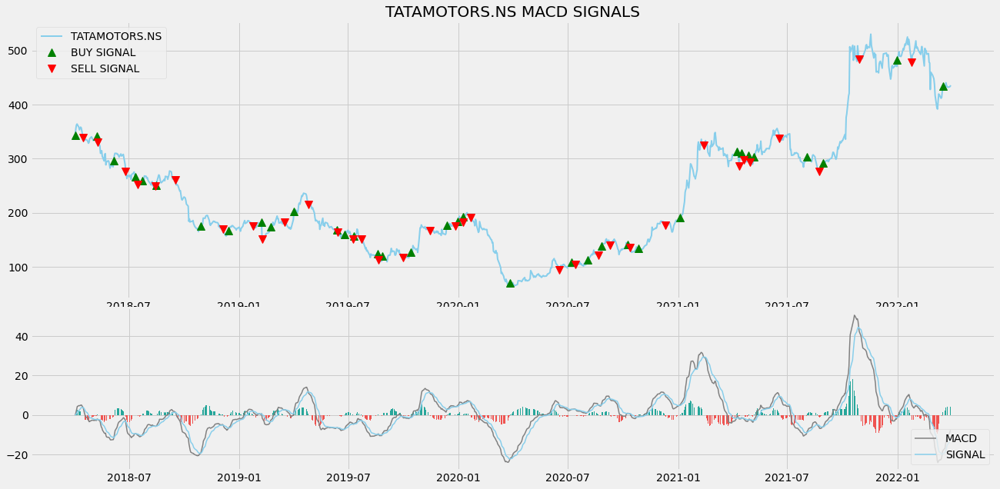

In [ ]:
# First get the list of picked_stocks

for i in picked_stocks:
  run_all_MACD(Stocks_Indicator[i], symbols[i])

## MACD on SMA 20

In [ ]:
output_path_MACD_SMA = strategy + '_' + test_size + '/MACD_on_SMA'

# Make experiment directory #
if not os.path.exists(output_path_MACD_SMA):
        os.makedirs(output_path_MACD_SMA)

In [ ]:
def run_all_MACD_on_SMA(df, sym_):
  sma = 'close_20_sma'
  temp = pd.DataFrame(df[sma])
  temp = df[[sma]].rename(columns={sma : 'close'})
  macd_signal_plot(temp, sym_, output_path_MACD_SMA)

  # set i in the code just above 'Plots on stock price and MA' 

  df_macd = get_macd(temp['close'], 26, 12, 9) # get macd and signal line values
  buy_price, sell_price, macd_signal = implement_macd_strategy(temp['close'], df_macd) # gets signal for buy and sell

  position = []
  for i in range(len(macd_signal)):
      if macd_signal[i] > 1:
          position.append(0)
      else:
          position.append(1)
          
  for i in range(len(temp['close'])):
      if macd_signal[i] == 1:
          position[i] = 1
      elif macd_signal[i] == -1:
          position[i] = 0
      else:
          position[i] = position[i-1]
          
  macd = df_macd['macd']
  signal = df_macd['signal']
  close_price = temp['close']
  macd_signal = pd.DataFrame(macd_signal).rename(columns = {0:'macd_signal'}).set_index(temp.index)
  position = pd.DataFrame(position).rename(columns = {0:'macd_position'}).set_index(temp.index)

  frames = [close_price, macd, signal, macd_signal, position]
  strategy = pd.concat(frames, join = 'inner', axis = 1)

  # backtesting on investment amount

  df_ret = pd.DataFrame(np.diff(temp['close'])).rename(columns = {0:'returns'})
  macd_strategy_ret = []

  for i in range(len(df_ret)):
      try:
          returns = df_ret['returns'][i]*strategy['macd_position'][i]
          macd_strategy_ret.append(returns)
      except:
          pass
      
  macd_strategy_ret_df = pd.DataFrame(macd_strategy_ret).rename(columns = {0:'macd_returns'})

  investment_value = 100_000
  number_of_stocks = floor(investment_value/temp['close'][0])
  macd_investment_ret = []

  for i in range(len(macd_strategy_ret_df['macd_returns'])):
      returns = number_of_stocks*macd_strategy_ret_df['macd_returns'][i]
      macd_investment_ret.append(returns)

  macd_investment_ret_df = pd.DataFrame(macd_investment_ret).rename(columns = {0:'investment_returns'})
  total_investment_ret = round(sum(macd_investment_ret_df['investment_returns']), 2)
  profit_percentage = floor((total_investment_ret/investment_value)*100)

  with open(os.path.join(output_path_MACD_SMA, sym_ + '_MACD_SMA.txt'), 'w') as f:
    f.write('Profit gained from the MACD on SMA strategy by investing $100k in ' + sym_ + ' : ' + str(total_investment_ret))
    f.write('\n Profit percentage of the MACD on SMA strategy for ' + sym_ + ' : ' + str(profit_percentage) + '%')
  
  print(sym_)

ONGC.NS
UPL.NS
ITC.NS
IOC.NS
SBIN.NS
NTPC.NS
COALINDIA.NS
INDUSINDBK.NS
RELIANCE.NS
TATAMOTORS.NS


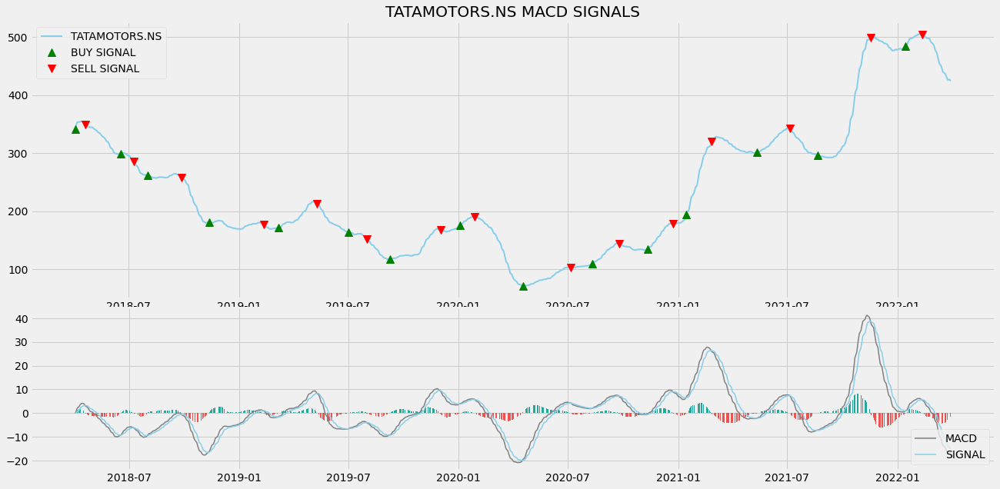

In [ ]:
# First get the list of picked_stocks

for i in picked_stocks:
  run_all_MACD_on_SMA(Stocks_Indicator[i], symbols[i])

# Stoch Oscillator (KD Index rule)

In [ ]:
plt.rcParams['figure.figsize'] = (20, 10)
plt.style.use('fivethirtyeight')

In [ ]:
output_path_SO = strategy + '_' + test_size + '/SO'

# Make experiment directory #
if not os.path.exists(output_path_SO):
        os.makedirs(output_path_SO)

In [ ]:
# STOCHASTIC OSCILLATOR CALCULATION
def get_stoch_osc(high, low, close, k_lookback, d_lookback):
    lowest_low = low.rolling(k_lookback).min()
    highest_high = high.rolling(k_lookback).max()
    k_line = ((close - lowest_low) / (highest_high - lowest_low)) * 100
    d_line = k_line.rolling(d_lookback).mean()
    return k_line, d_line

# TRADING STRATEGY

def implement_stoch_strategy(prices, k, d):    
    buy_price = []
    sell_price = []
    stoch_signal = []
    signal = 0

    for i in range(len(prices)):
        if k[i] < 20 and d[i] < 20 and k[i] > d[i]:
            if signal != 1:
                buy_price.append(prices[i])
                sell_price.append(np.nan)
                signal = 1
                stoch_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                stoch_signal.append(0)
                
        elif k[i] > 80 and d[i] > 80 and k[i] < d[i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(prices[i])
                signal = -1
                stoch_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                stoch_signal.append(0)
        
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            stoch_signal.append(0)
            
    return buy_price, sell_price, stoch_signal

# STOCHASTIC OSCILLATOR PLOT
def stoch_plot(df, label_):
  buy_price, sell_price, stoch_signal = implement_stoch_strategy(df['close'], df['%k'], df['%d'])

  ax1 = plt.subplot2grid((14,1), (0,0), rowspan = 7, colspan = 1)
  ax2 = plt.subplot2grid((15,1), (9,0), rowspan = 6, colspan = 1)

  ax1.plot(df['close'], color = 'skyblue', linewidth = 2, label = label_)
  ax1.plot(df.index, buy_price, marker = '^', color = 'green', markersize = 10, label = 'BUY SIGNAL', linewidth = 0)
  ax1.plot(df.index, sell_price, marker = 'v', color = 'r', markersize = 10, label = 'SELL SIGNAL', linewidth = 0)
  ax1.legend()
  ax1.set_title(label_ + ' Stochastic Oscillator')
    
  ax2.plot(df['%k'], color = 'deepskyblue', linewidth = 1.5, label = '%K')
  ax2.plot(df['%d'], color = 'orange', linewidth = 1.5, label = '%D')
  ax2.axhline(80, color = 'black', linewidth = 1, linestyle = '--')
  ax2.axhline(20, color = 'black', linewidth = 1, linestyle = '--')
  ax2.set_title(label_ + ' STOCH 14,3')
  ax2.legend(loc = 'right')
          
  plt.legend(loc = 'lower right')
  # plt.show()
  plt.savefig(os.path.join(output_path_SO, label_ + '.png'))

In [ ]:
def run_all_SO(df, sym_):
  df['%k'], df['%d'] = get_stoch_osc(df['high'], df['low'], df['close'], 14, 3)

  stoch_plot(df, sym_)
  buy_price, sell_price, stoch_signal = implement_stoch_strategy(df['close'], df['%k'], df['%d'])

  # POSITION

  position = []
  for i in range(len(stoch_signal)):
      if stoch_signal[i] > 1:
          position.append(0)
      else:
          position.append(1)
          
  for i in range(len(df['close'])):
      if stoch_signal[i] == 1:
          position[i] = 1
      elif stoch_signal[i] == -1:
          position[i] = 0
      else:
          position[i] = position[i-1]
          
  close_price = df['close']
  k_line = df['%k']
  d_line = df['%d']
  stoch_signal = pd.DataFrame(stoch_signal).rename(columns = {0:'stoch_signal'}).set_index(df.index)
  position = pd.DataFrame(position).rename(columns = {0:'stoch_position'}).set_index(df.index)

  frames = [close_price, k_line, d_line, stoch_signal, position]
  strategy = pd.concat(frames, join = 'inner', axis = 1)

  # BACKTESTING

  df_ret = pd.DataFrame(np.diff(df['close'])).rename(columns = {0:'returns'})
  stoch_strategy_ret = []

  for i in range(len(df_ret)):
      try:
          returns = df_ret['returns'][i] * strategy['stoch_position'][i]
          stoch_strategy_ret.append(returns)
      except:
          pass
      
  stoch_strategy_ret_df = pd.DataFrame(stoch_strategy_ret).rename(columns = {0:'stoch_returns'})

  investment_value = 100000
  number_of_stocks = floor(investment_value / df['close'][0])
  stoch_investment_ret = []

  for i in range(len(stoch_strategy_ret_df['stoch_returns'])):
      returns = number_of_stocks * stoch_strategy_ret_df['stoch_returns'][i]
      stoch_investment_ret.append(returns)

  stoch_investment_ret_df = pd.DataFrame(stoch_investment_ret).rename(columns = {0:'investment_returns'})
  total_investment_ret = round(sum(stoch_investment_ret_df['investment_returns']), 2)
  profit_percentage = floor((total_investment_ret / investment_value) * 100)

  with open(os.path.join(output_path_SO, sym_ + '_MAC.txt'), 'w') as f:
    f.write('Profit gained from the STOCH strategy by investing $100k in ' + sym_ + ' : ' + str(total_investment_ret))
    f.write('\n Profit percentage of the STOCH strategy for ' + sym_ + ' : ' + str(profit_percentage) + '%')
  
  print(sym_)

ONGC.NS
UPL.NS
ITC.NS
IOC.NS
SBIN.NS
NTPC.NS
COALINDIA.NS
INDUSINDBK.NS
RELIANCE.NS
TATAMOTORS.NS


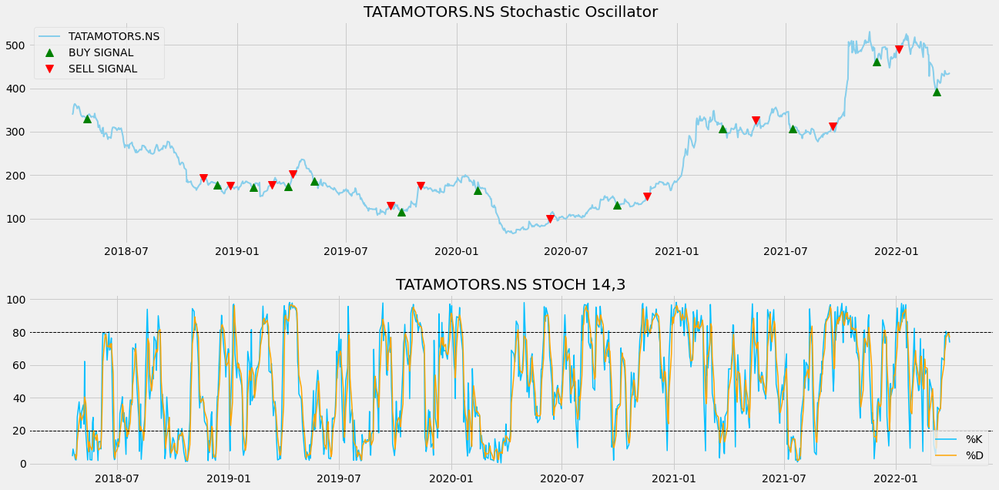

In [ ]:
# First get the list of picked_stocks

for i in picked_stocks:
  run_all_SO(Stocks_Indicator[i], symbols[i])

# Stochastic Oscillator + MACD

In [ ]:
# plt.rcParams['figure.figsize'] = (20, 20)
# plt.style.use('fivethirtyeight')

In [ ]:
output_path_SO_MACD = strategy + '_' + test_size + '/SO_MACD'

# Make experiment directory #
if not os.path.exists(output_path_SO_MACD):
        os.makedirs(output_path_SO_MACD)

In [ ]:
# Stoch + MACD Plot
def plot_stoch_macd(df, label_, short = 12, long = 26, signal = 9):

  df_macd = get_macd(df['close'], 26, 12, 9) # get macd and signal line values
  buy_price, sell_price, stoch_macd_signal = implement_stoch_macd_strategy(df['close'], df['%k'], df['%d'], df_macd)

  fig, (ax1, ax2, ax3) = plt.subplots(3)

  # ax1 = plt.subplot2grid((14,1), (0,0), rowspan = 7, colspan = 1)
  # ax2 = plt.subplot2grid((15,1), (9,0), rowspan = 6, colspan = 1)
  # ax3 = plt.subplot2grid((26,1), (18,0), rowspan = 6, colspan = 1)

  ax1.plot(df['close'], color = 'skyblue', linewidth = 2, label = label_)
  ax1.plot(df.index, buy_price, marker = '^', color = 'green', markersize = 10, label = 'BUY SIGNAL', linewidth = 0)
  ax1.plot(df.index, sell_price, marker = 'v', color = 'r', markersize = 10, label = 'SELL SIGNAL', linewidth = 0)
  ax1.legend()
  ax1.set_title(label_ + ' STOCH + MACD SIGNALS')

  ax2.plot(df_macd['macd'], color = 'grey', linewidth = 1.5, label = 'MACD')
  ax2.plot(df_macd['signal'], color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')

  for i in range(len(df_macd)):
      if str(df_macd['hist'][i])[0] == '-':
          ax2.bar(df_macd.index[i], df_macd['hist'][i], color = '#ef5350')
      else:
          ax2.bar(df_macd.index[i], df_macd['hist'][i], color = '#26a69a')
    
  ax3.plot(df['%k'], color = 'deepskyblue', linewidth = 1.5, label = '%K')
  ax3.plot(df['%d'], color = 'orange', linewidth = 1.5, label = '%D')
  ax3.axhline(80, color = 'black', linewidth = 1, linestyle = '--')
  ax3.axhline(20, color = 'black', linewidth = 1, linestyle = '--')
  # ax3.set_title(label_ + ' STOCH 14,3')
  ax3.legend(loc = 'right')
          
  plt.legend(loc = 'lower right')

  plt.savefig(os.path.join(output_path_SO_MACD, label_ + '.png'))

# TRADING STRATEGY
def implement_stoch_macd_strategy(prices, k, d, data):    
    buy_price = []
    sell_price = []
    stoch_macd_signal = []
    signal = 0

    for i in range(len(prices)):
        if k[i] < 20 and d[i] < 20 and k[i] > d[i] and data['macd'][i] > data['signal'][i]:
            if signal != 1:
                buy_price.append(prices[i])
                sell_price.append(np.nan)
                signal = 1
                stoch_macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                stoch_macd_signal.append(0)
                
        elif k[i] > 80 and d[i] > 80 and k[i] < d[i] and data['macd'][i] < data['signal'][i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(prices[i])
                signal = -1
                stoch_macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                stoch_macd_signal.append(0)
        
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            stoch_macd_signal.append(0)
            
    return buy_price, sell_price, stoch_macd_signal


# STOCHASTIC OSCILLATOR CALCULATION
def get_stoch_osc(high, low, close, k_lookback, d_lookback):
    lowest_low = low.rolling(k_lookback).min()
    highest_high = high.rolling(k_lookback).max()
    k_line = ((close - lowest_low) / (highest_high - lowest_low)) * 100
    d_line = k_line.rolling(d_lookback).mean()
    return k_line, d_line

# MACD CALCULATION
def get_macd(price, slow, fast, smooth):
    exp1 = price.ewm(span = fast, adjust = False).mean()
    exp2 = price.ewm(span = slow, adjust = False).mean()
    macd = pd.DataFrame(exp1 - exp2).rename(columns = {'close':'macd'})
    signal = pd.DataFrame(macd.ewm(span = smooth, adjust = False).mean()).rename(columns = {'macd':'signal'})
    hist = pd.DataFrame(macd['macd'] - signal['signal']).rename(columns = {0:'hist'})
    frames =  [macd, signal, hist]
    df = pd.concat(frames, join = 'inner', axis = 1)
    return df

In [ ]:
def run_all_STOCH_MACD(df, sym_):

  df_macd = get_macd(df['close'], 26, 12, 9) # get macd and signal line values
  df['%k'], df['%d'] = get_stoch_osc(df['high'], df['low'], df['close'], 14, 3)
  buy_price, sell_price, stoch_macd_signal = implement_stoch_macd_strategy(df['close'], df['%k'], df['%d'], df_macd)

  plot_stoch_macd(df, sym_)

  # POSITION

  position = []
  for i in range(len(stoch_macd_signal)):
      if stoch_macd_signal[i] > 1:
          position.append(0)
      else:
          position.append(1)
          
  for i in range(len(df['close'])):
      if stoch_macd_signal[i] == 1:
          position[i] = 1
      elif stoch_macd_signal[i] == -1:
          position[i] = 0
      else:
          position[i] = position[i-1]
          
  close_price = df['close']
  k_line = df['%k']
  d_line = df['%d']
  macd_line = df_macd['macd']
  signal_line = df_macd['signal']
  stoch_macd_signal = pd.DataFrame(stoch_macd_signal).rename(columns = {0:'stoch_macd_signal'}).set_index(df.index)
  position = pd.DataFrame(position).rename(columns = {0:'stoch_macd_position'}).set_index(df.index)

  frames = [close_price, k_line, d_line, macd_line, signal_line, stoch_macd_signal, position]
  strategy = pd.concat(frames, join = 'inner', axis = 1)

  # BACKTESTING

  df_ret = pd.DataFrame(np.diff(df['close'])).rename(columns = {0:'returns'})
  stoch_macd_strategy_ret = []

  for i in range(len(df_ret)):
      try:
          returns = df_ret['returns'][i] * strategy['stoch_macd_position'][i]
          stoch_macd_strategy_ret.append(returns)
      except:
          pass
      
  stoch_macd_strategy_ret_df = pd.DataFrame(stoch_macd_strategy_ret).rename(columns = {0:'stoch_macd_returns'})

  investment_value = 100000
  number_of_stocks = floor(investment_value / df['close'][0])
  stoch_macd_investment_ret = []

  for i in range(len(stoch_macd_strategy_ret_df['stoch_macd_returns'])):
      returns = number_of_stocks * stoch_macd_strategy_ret_df['stoch_macd_returns'][i]
      stoch_macd_investment_ret.append(returns)

  stoch_macd_investment_ret_df = pd.DataFrame(stoch_macd_investment_ret).rename(columns = {0:'investment_returns'})
  total_investment_ret = round(sum(stoch_macd_investment_ret_df['investment_returns']), 2)
  profit_percentage = floor((total_investment_ret / investment_value) * 100)

  with open(os.path.join(output_path_SO_MACD, sym_ + '_STOCH_MACD.txt'), 'w') as f:
    f.write('Profit gained from the STOCH MACD strategy by investing $100k in ' + sym_ + ' : ' + str(total_investment_ret))
    f.write('\n Profit percentage of the STOCH MACD strategy for ' + sym_ + ' : ' + str(profit_percentage) + '%')
  
  print(sym_)

ONGC.NS
UPL.NS
ITC.NS
IOC.NS
SBIN.NS
NTPC.NS
COALINDIA.NS
INDUSINDBK.NS
RELIANCE.NS
TATAMOTORS.NS


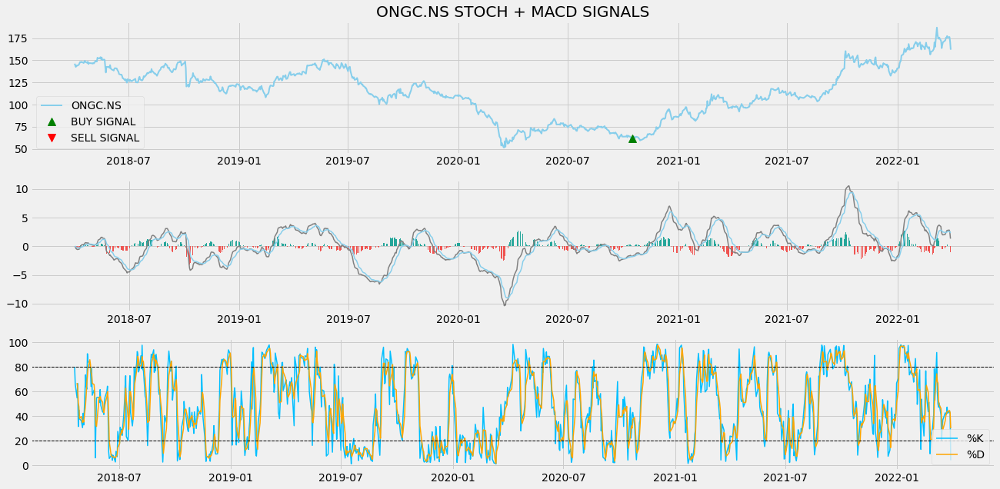

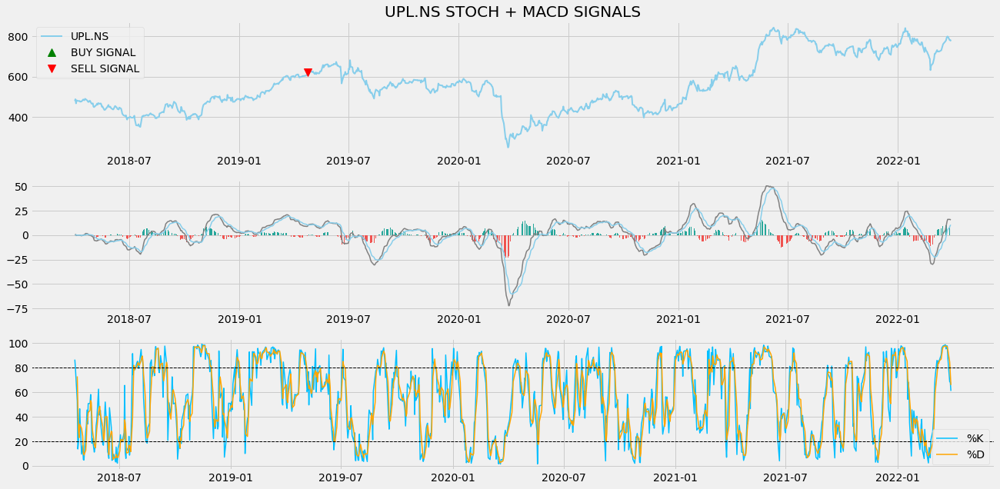

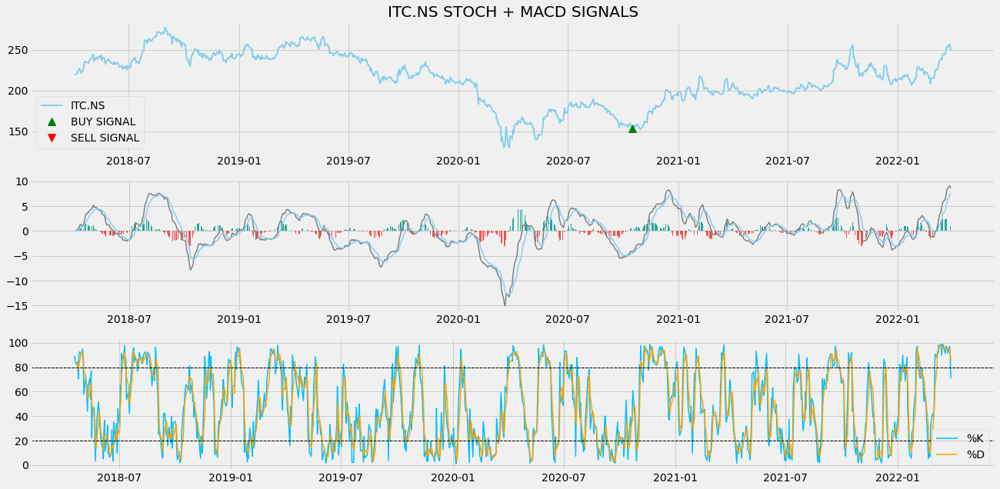

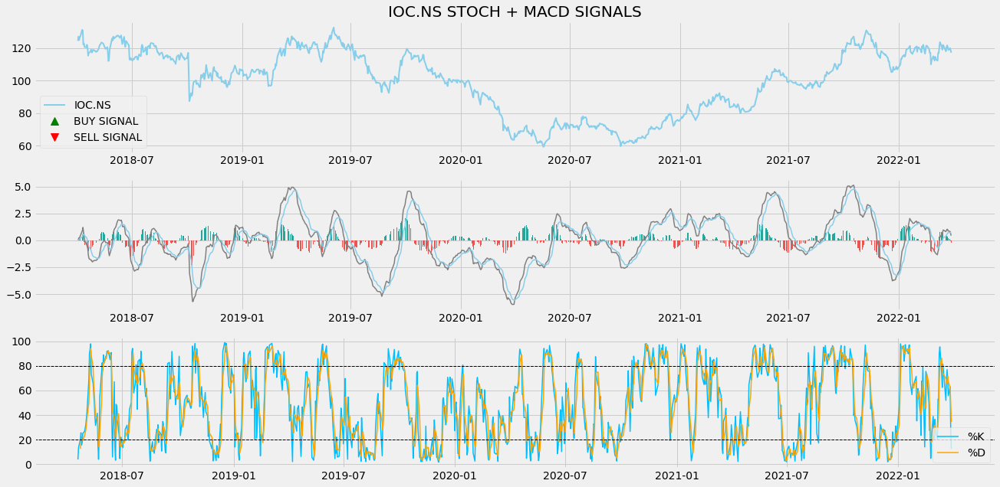

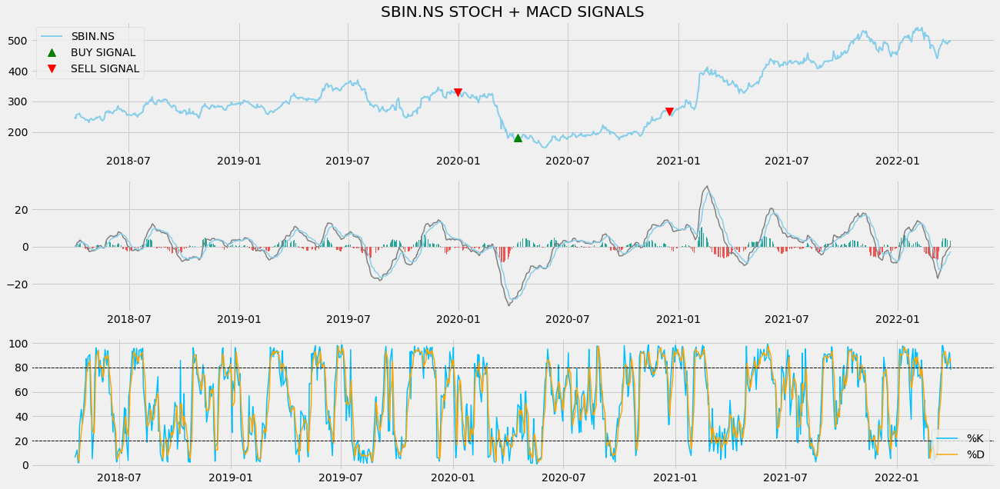

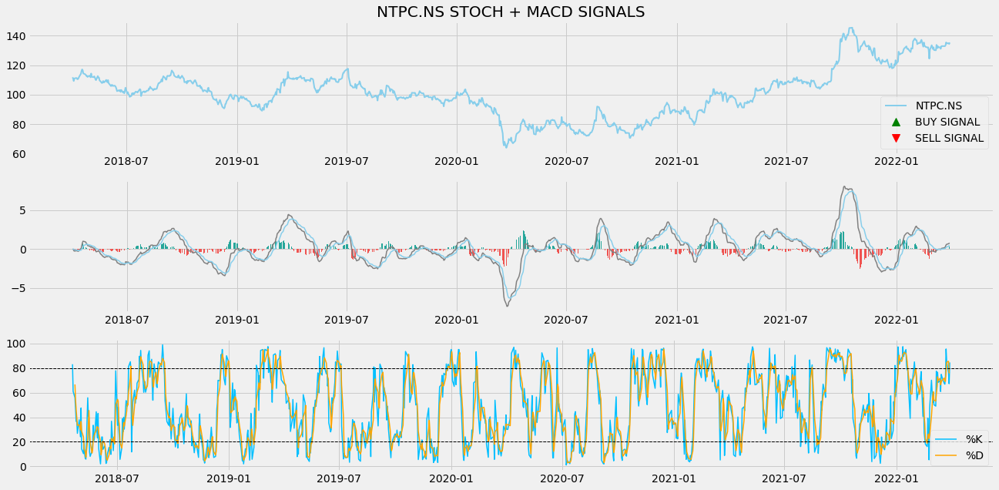

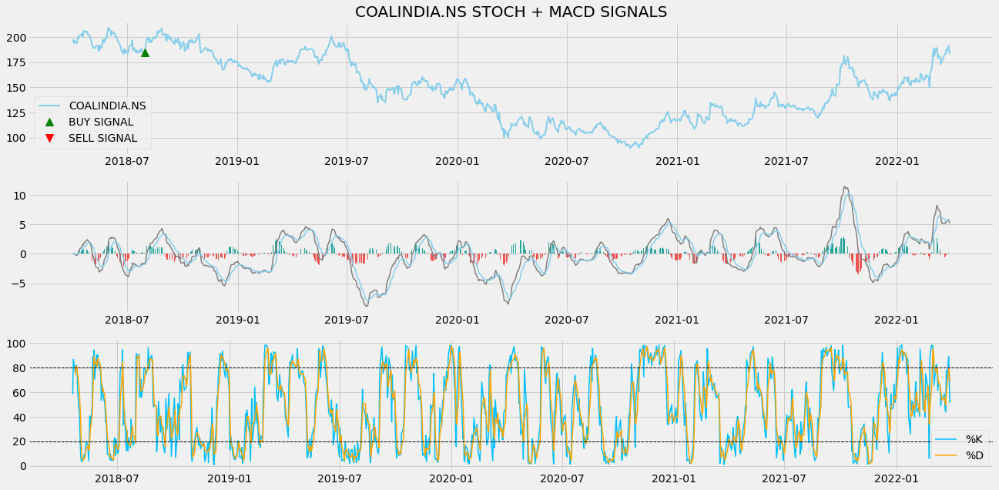

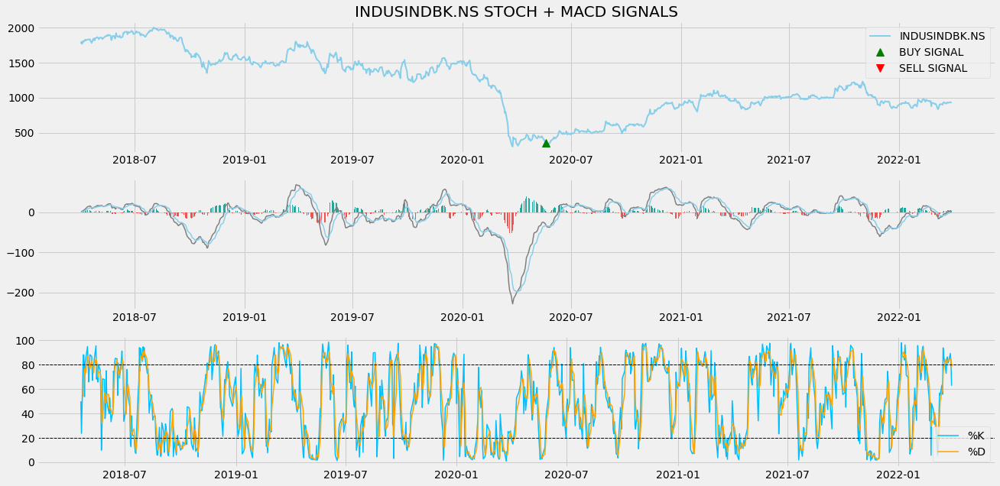

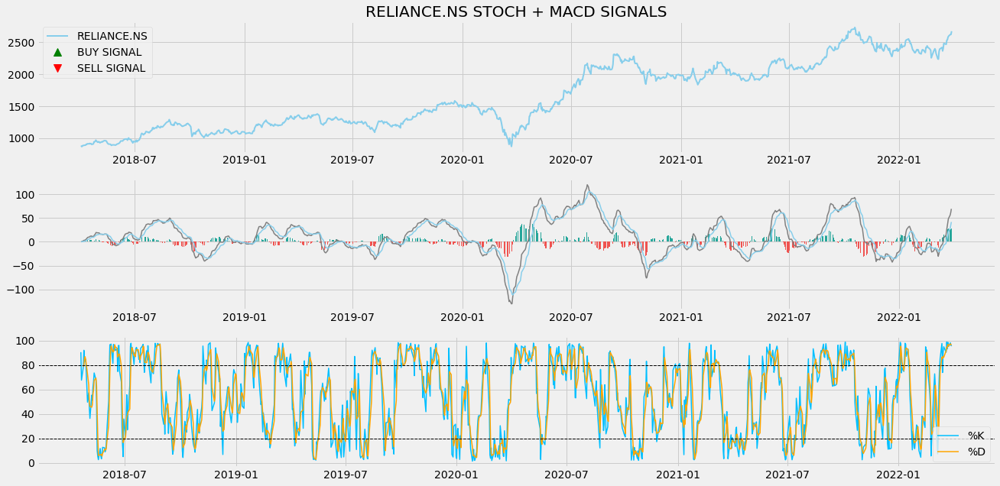

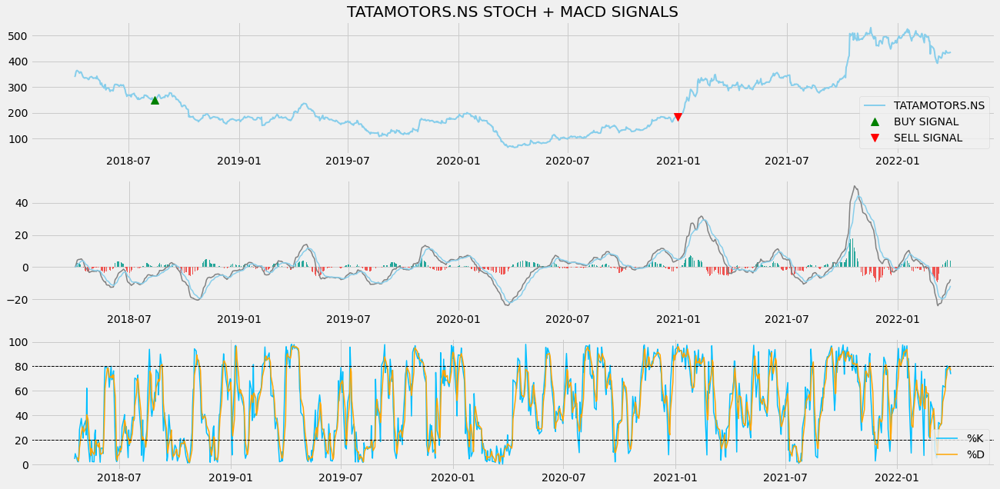

In [ ]:
# First get the list of picked_stocks

for i in picked_stocks:
  run_all_STOCH_MACD(Stocks_Indicator[i], symbols[i])

# Williams %R + MACD

In [ ]:
output_path_WR_MACD = strategy + '_' + test_size + '/WR_MACD'

# Make experiment directory #
if not os.path.exists(output_path_WR_MACD):
        os.makedirs(output_path_WR_MACD)

In [ ]:
# WILLIAMS %R CALCULATION
def get_wr(high, low, close, lookback):
    highh = high.rolling(lookback).max() 
    lowl = low.rolling(lookback).min()
    wr = -100 * ((highh - close) / (highh - lowl))
    return wr

# MACD CALCULATION
def get_macd(price, slow, fast, smooth):
    exp1 = price.ewm(span = fast, adjust = False).mean()
    exp2 = price.ewm(span = slow, adjust = False).mean()
    macd = pd.DataFrame(exp1 - exp2).rename(columns = {'close':'macd'})
    signal = pd.DataFrame(macd.ewm(span = smooth, adjust = False).mean()).rename(columns = {'macd':'signal'})
    hist = pd.DataFrame(macd['macd'] - signal['signal']).rename(columns = {0:'hist'})
    frames =  [macd, signal, hist]
    df = pd.concat(frames, join = 'inner', axis = 1)
    return df

# TRADING STRATEGY
def implement_wr_macd_strategy(prices, wr, data):
    buy_price = []
    sell_price = []
    wr_macd_signal = []
    signal = 0

    for i in range(len(wr)):
        if wr[i-1] > -50 and wr[i] < -50 and data['macd'][i] > data['signal'][i]:
            if signal != 1:
                buy_price.append(prices[i])
                sell_price.append(np.nan)
                signal = 1
                wr_macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                wr_macd_signal.append(0)
                
        elif wr[i-1] < -50 and wr[i] > -50 and data['macd'][i] < data['signal'][i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(prices[i])
                signal = -1
                wr_macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                wr_macd_signal.append(0)
        
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            wr_macd_signal.append(0)
            
    return buy_price, sell_price, wr_macd_signal

In [ ]:
# WR + MACD Plot
def plot_wr_macd(df, label_, short = 12, long = 26, signal = 9):

  df['wr_14'] = get_wr(df['high'], df['low'], df['close'], 14)
  df_macd = get_macd(df['close'], 26, 12, 9) # get macd and signal line values
  buy_price, sell_price, stoch_macd_signal = implement_wr_macd_strategy(df['close'], df['wr_14'], df_macd)

  fig, (ax1, ax2, ax3) = plt.subplots(3)

  ax1.plot(df['close'], color = 'skyblue', linewidth = 2, label = label_)
  ax1.plot(df.index, buy_price, marker = '^', color = 'green', markersize = 10, label = 'BUY SIGNAL', linewidth = 0)
  ax1.plot(df.index, sell_price, marker = 'v', color = 'r', markersize = 10, label = 'SELL SIGNAL', linewidth = 0)
  ax1.legend()
  ax1.set_title(label_ + ' Williams %R + MACD SIGNALS')

  # MACD
  ax2.plot(df_macd['macd'], color = 'grey', linewidth = 1.5, label = 'MACD')
  ax2.plot(df_macd['signal'], color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')

  for i in range(len(df_macd)):
      if str(df_macd['hist'][i])[0] == '-':
          ax2.bar(df_macd.index[i], df_macd['hist'][i], color = '#ef5350')
      else:
          ax2.bar(df_macd.index[i], df_macd['hist'][i], color = '#26a69a')

  # Williams %R
  ax3.plot(df['wr_14'], color = 'orange', linewidth = 2, label = 'Williams %R')
  ax3.axhline(-20, linewidth = 1.5, linestyle = '--', color = 'grey')
  ax3.axhline(-80, linewidth = 1.5, linestyle = '--', color = 'grey')
  ax3.legend(loc = 'right')

  plt.legend(loc = 'lower right')

  plt.savefig(os.path.join(output_path_WR_MACD, label_ + '.png'))

In [ ]:
def run_all_WR_MACD(df, sym_):
  df_macd = get_macd(df['close'], 26, 12, 9) # get macd and signal line values
  buy_price, sell_price, wr_macd_signal = implement_wr_macd_strategy(df['close'], df['wr_14'], df_macd)

  plot_wr_macd(df, sym_)

  # POSITION
  position = []
  for i in range(len(wr_macd_signal)):
      if wr_macd_signal[i] > 1:
          position.append(0)
      else:
          position.append(1)
          
  for i in range(len(df['close'])):
      if wr_macd_signal[i] == 1:
          position[i] = 1
      elif wr_macd_signal[i] == -1:
          position[i] = 0
      else:
          position[i] = position[i-1]
          
  close_price = df['close']
  wr = df['wr_14']
  macd_line = df_macd['macd']
  signal_line = df_macd['signal']
  wr_macd_signal = pd.DataFrame(wr_macd_signal).rename(columns = {0:'wr_macd_signal'}).set_index(df.index)
  position = pd.DataFrame(position).rename(columns = {0:'wr_macd_position'}).set_index(df.index)

  frames = [close_price, wr, macd_line, signal_line, wr_macd_signal, position]
  strategy = pd.concat(frames, join = 'inner', axis = 1)

  # BACKTESTING
  df_ret = pd.DataFrame(np.diff(df['close'])).rename(columns = {0:'returns'})
  wr_macd_strategy_ret = []

  for i in range(len(df_ret)):
      try:
          returns = df_ret['returns'][i] * strategy['wr_macd_position'][i]
          wr_macd_strategy_ret.append(returns)
      except:
          pass
      
  wr_macd_strategy_ret_df = pd.DataFrame(wr_macd_strategy_ret).rename(columns = {0:'wr_macd_returns'})

  investment_value = 100000
  number_of_stocks = floor(investment_value / df['close'][0])
  wr_macd_investment_ret = []

  for i in range(len(wr_macd_strategy_ret_df['wr_macd_returns'])):
      returns = number_of_stocks * wr_macd_strategy_ret_df['wr_macd_returns'][i]
      wr_macd_investment_ret.append(returns)

  wr_macd_investment_ret_df = pd.DataFrame(wr_macd_investment_ret).rename(columns = {0:'investment_returns'})
  total_investment_ret = round(sum(wr_macd_investment_ret_df['investment_returns']), 2)
  profit_percentage = floor((total_investment_ret / investment_value) * 100)

  with open(os.path.join(output_path_WR_MACD, sym_ + '_WR_MACD.txt'), 'w') as f:
    f.write('Profit gained from the STOCH MACD strategy by investing $100k in ' + sym_ + ' : ' + str(total_investment_ret))
    f.write('\n Profit percentage of the STOCH MACD strategy for ' + sym_ + ' : ' + str(profit_percentage) + '%')
  
  print(sym_)

ONGC.NS
UPL.NS
ITC.NS
IOC.NS
SBIN.NS
NTPC.NS
COALINDIA.NS
INDUSINDBK.NS
RELIANCE.NS
TATAMOTORS.NS


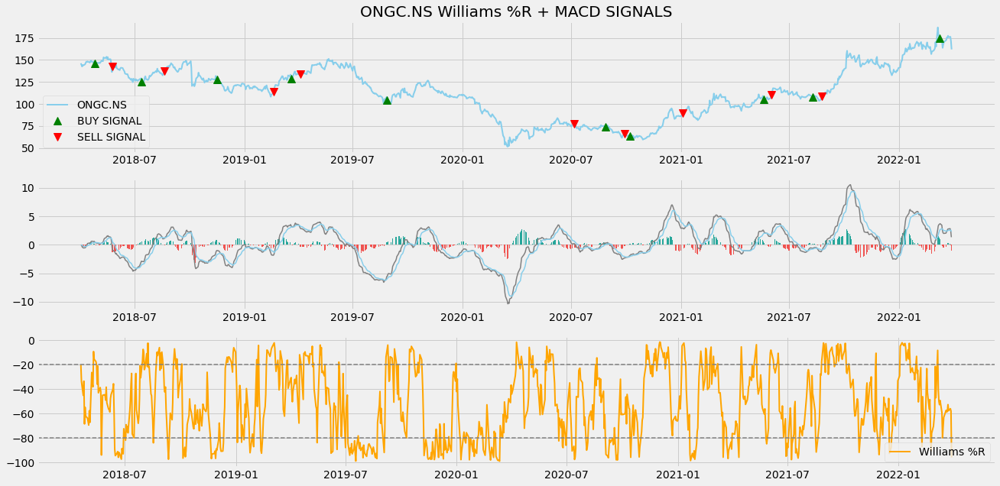

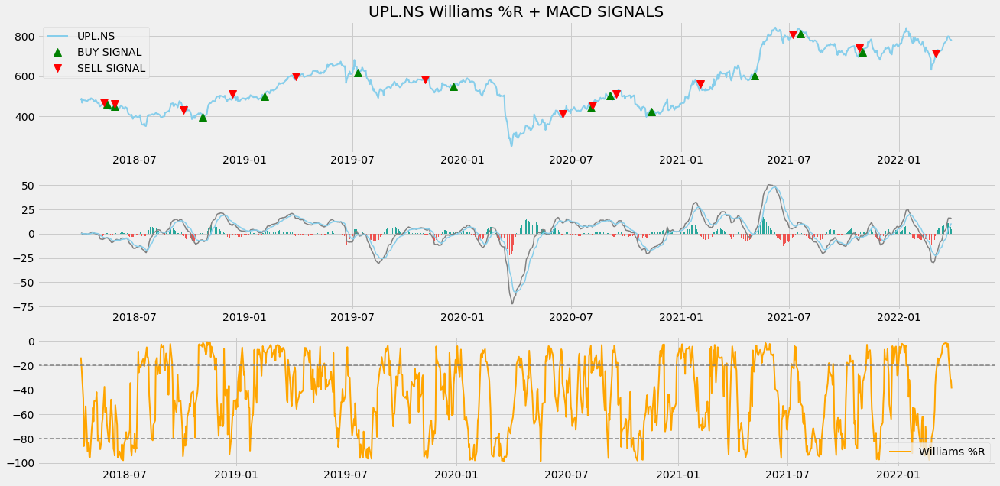

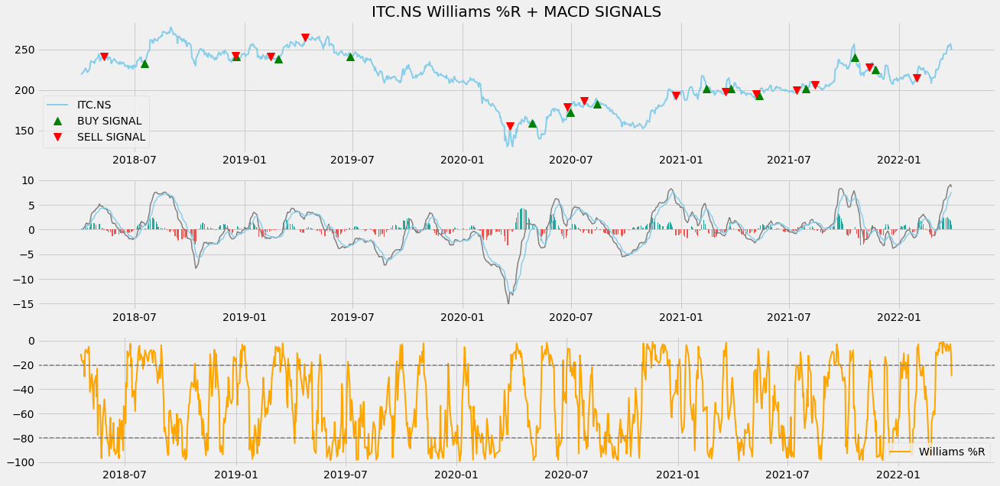

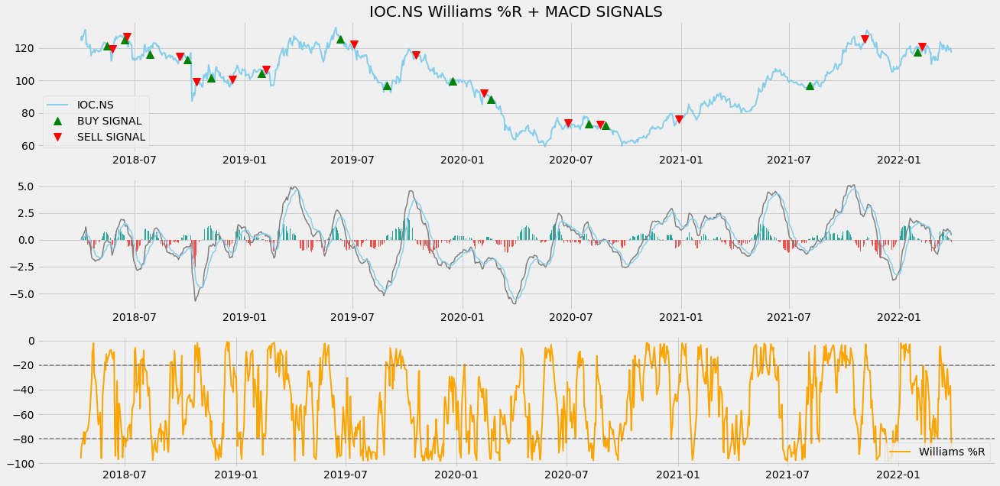

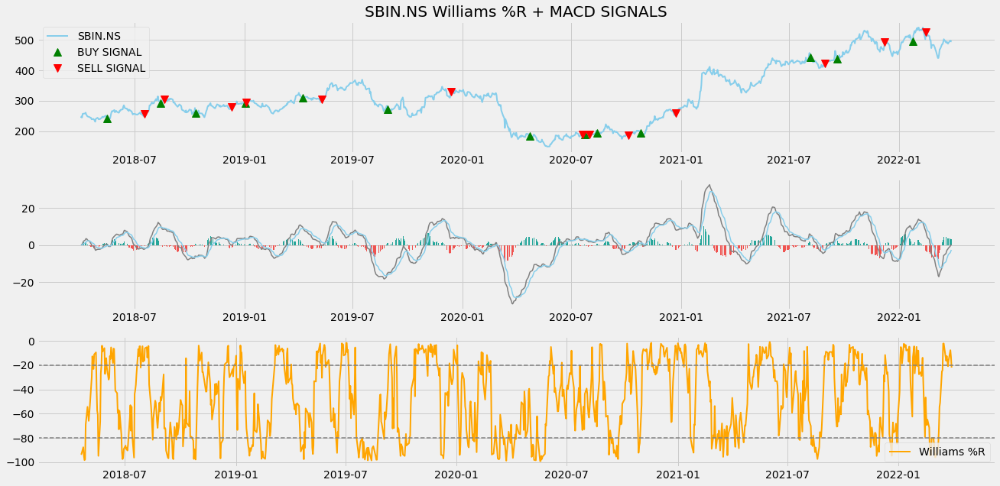

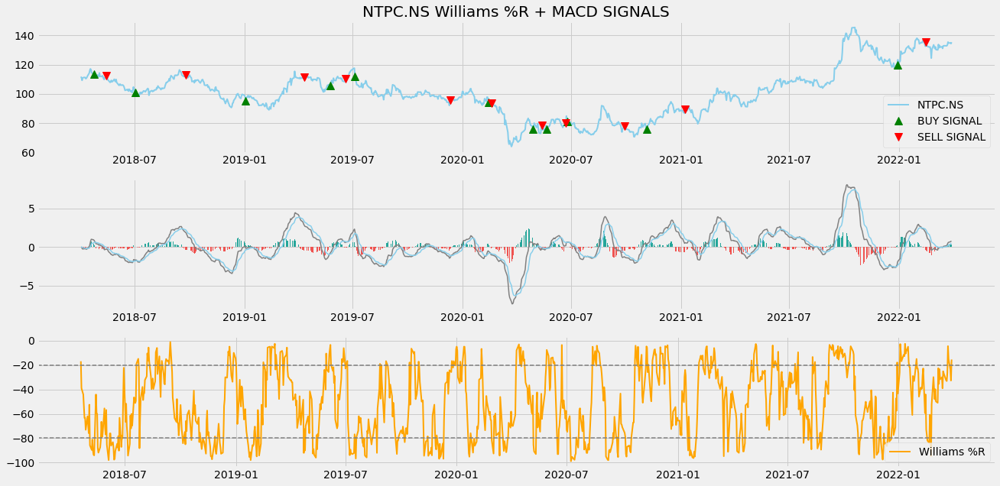

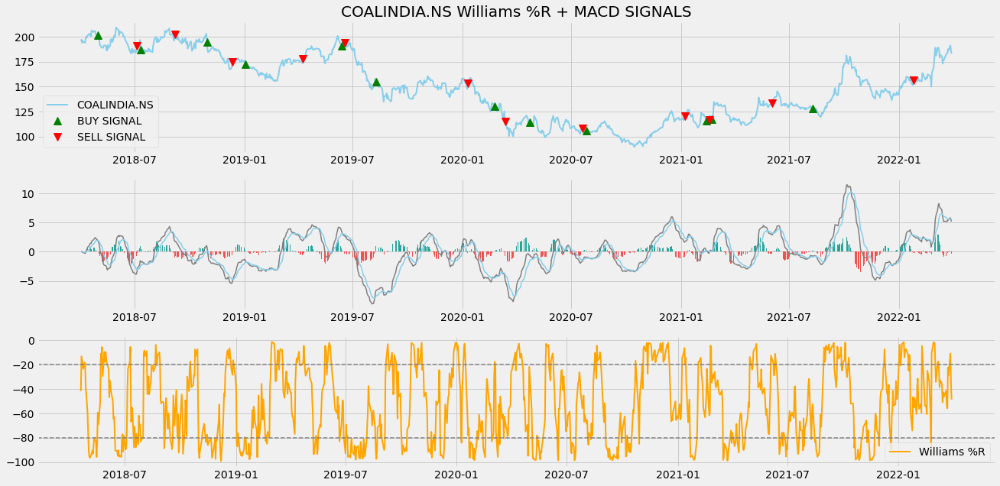

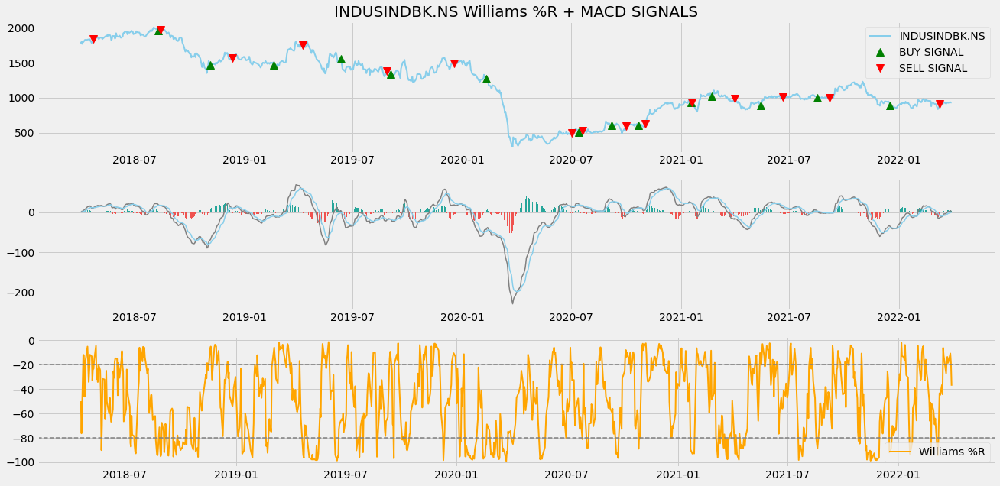

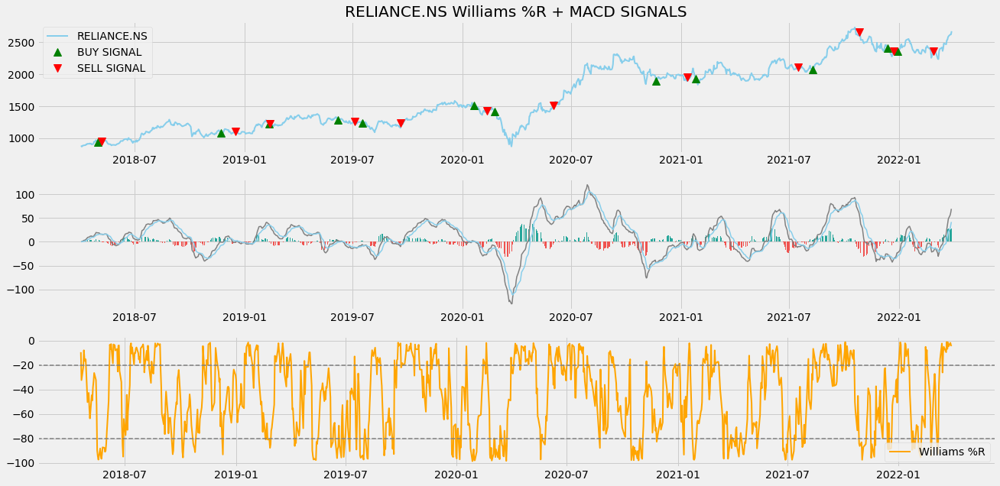

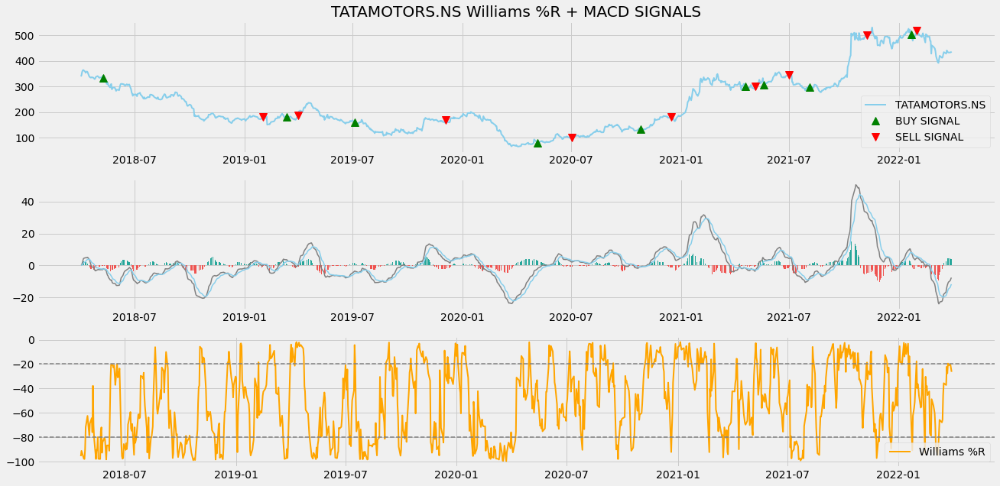

In [ ]:
# First get the list of picked_stocks

for i in picked_stocks:
  run_all_WR_MACD(Stocks_Indicator[i], symbols[i])

# Corr Plots, Rets Plot -- APPENDIX

In [ ]:
# all picked stocks + NIFTY50 index
all_picked_stocks = [0, 1,  2,  3,  5,  7, 10, 12, 13, 15, 17, 21, 23, 24, 28, 29, 30, 34, 39, 40, 41, 42, 44, 45, 46, 50]

In [ ]:
# Calculation of returns

rets = ClosePrice.pct_change()
rets = rets.dropna()

In [ ]:
rets_picked = rets.iloc[:, all_picked_stocks]

In [ ]:
# rets_picked

In [ ]:
n = len(rets_picked.columns) 
col = 5
row = int(np.ceil(n/col))
fig_hei = row * 8 
fig_wid = col * 8 

ax = rets_picked.plot(subplots=True, layout=(row ,col), figsize=(fig_wid, fig_hei),
             sharey=True, sharex=True,
             title = 'Daily returns vs. Year',grid=True, lw = 2)

for i in range(col):
    ax[0,i].xaxis.set_tick_params(which='both', top = True, labeltop=True, labelrotation=40)
    
fig = ax[0,0].get_figure()
fig.tight_layout()
fig.subplots_adjust(top=0.93)
plt.show()

In [ ]:
correlation_matrix = rets_picked.corr()
print("Correlation Matrix")
display(correlation_matrix)

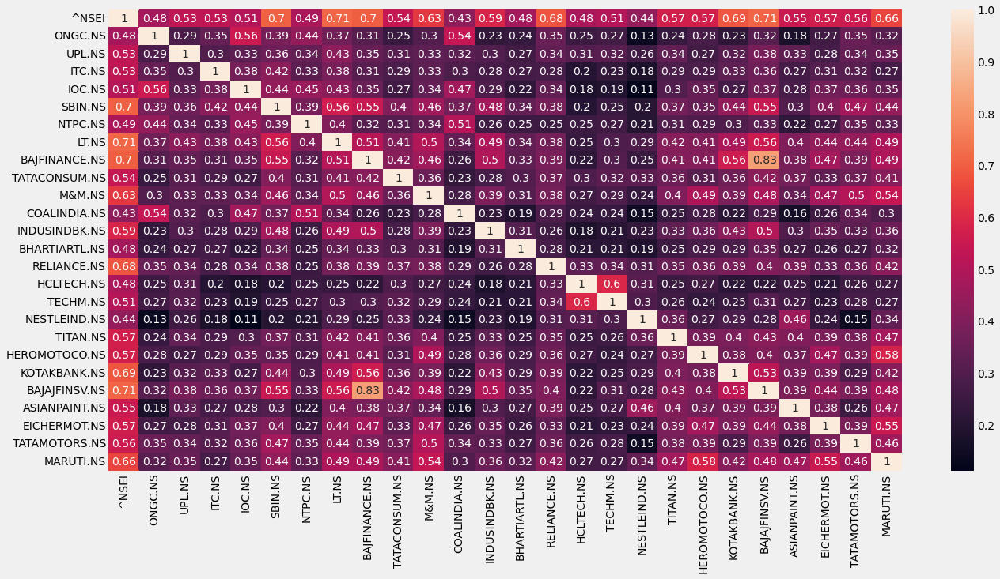

In [ ]:
ax = sns.heatmap(rets_picked.corr(), annot=True)

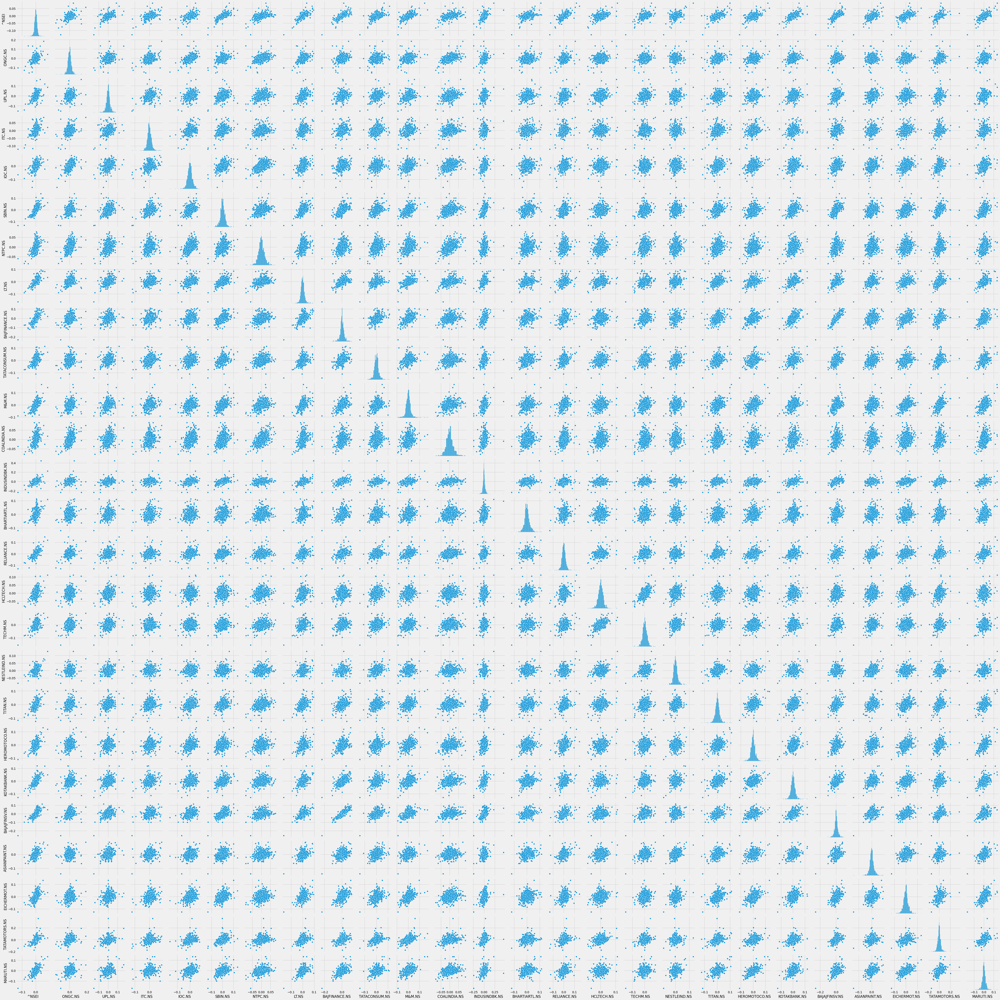

In [ ]:
# sns.set(style = 'ticks', font_scale = 1.25)
sns.pairplot(rets_picked)

# Download Folders

In [ ]:
# !zip -r /content/signals.zip /content/LR_10
# !zip -r /content/signals.zip /content/SVR_10
# !zip -r /content/signals.zip /content/LSTM_10

# !zip -r /content/signals.zip /content/LR_6
# !zip -r /content/signals.zip /content/SVR_6
# !zip -r /content/signals.zip /content/LSTM_6

# !zip -r /content/signals.zip /content/LR_2
# !zip -r /content/signals.zip /content/SVR_2
!zip -r /content/signals.zip /content/LSTM_2

# TEMP

### Below process is calculating Weights for the whole time period. Make a loop over to calculate for each month separately

In [ ]:
rets = pd.DataFrame(columns=symbols, index=Stocks_Daily[0].index)

for i in range(len(Stocks_Daily)):
  rets[symbols[i]] = Stocks_Daily[i][['Rets']]

rets = rets.dropna()

In [ ]:
rets.head(10)

,TATAMOTORS.NS,POWERGRID.NS,TATACONSUM.NS,ASHOKLEY.NS,RELIANCE.NS
Date,,,,,
2016-11-01,-0.144693,0.090961,-0.115041,-0.119114,-0.061520
2016-12-01,0.027651,-0.043773,-0.014937,0.007547,0.093278
2017-01-01,0.109216,0.129156,0.056148,0.132959,-0.034368
2017-02-01,-0.127590,-0.072635,0.071401,-0.001102,0.184510
2017-03-01,0.019923,0.031924,0.090547,-0.067292,0.066920
2017-04-01,-0.014919,0.054233,0.016938,0.010053,0.056250
2017-05-01,0.037590,-0.000241,-0.024167,0.106557,-0.039062
2017-06-01,-0.091568,0.012503,0.008367,-0.006878,0.029313
2017-07-01,0.027858,0.060556,0.125457,0.166756,0.170435


In [ ]:
def get_weights(df_rets):
  df_weights = pd.DataFrame(columns=df_rets.columns, index=df_rets.index)

  start_window_index = df_rets.shape[1] + 1 # kept the minimum number of past returns to start with as 1 more than the total number of assets as the omega becomes singular otherwise
  for i in range(start_window_index, len(df_rets)):
    temp = df_rets.iloc[0:i]
    omega = np.cov(temp.T)

    n_assets = temp.shape[1]
    n_data_points = temp.shape[0]
    
    # Optimization to get weights
    e = np.ones(n_assets)
    omega_inv_dot_e = np.dot(np.linalg.inv(omega), e)
    w_star = omega_inv_dot_e/(np.dot(e.T, omega_inv_dot_e))
    assert np.allclose(np.sum(w_star), 1.0) # if not w_star not equal to 1, it will emit error
    
    df_weights.iloc[i] = w_star

  return df_weights

In [ ]:
weights = get_weights(rets)

In [ ]:
weights

,TATAMOTORS.NS,POWERGRID.NS,TATACONSUM.NS,ASHOKLEY.NS,RELIANCE.NS
Date,,,,,
2016-11-01,NaN,NaN,NaN,NaN,NaN
2016-12-01,NaN,NaN,NaN,NaN,NaN
2017-01-01,NaN,NaN,NaN,NaN,NaN
2017-02-01,NaN,NaN,NaN,NaN,NaN
2017-03-01,NaN,NaN,NaN,NaN,NaN
2017-04-01,NaN,NaN,NaN,NaN,NaN
2017-05-01,0.11152,0.598579,-0.288621,-0.0719224,0.650444
2017-06-01,0.0934365,0.527616,-0.340503,0.129274,0.590176
2017-07-01,0.0322187,0.535529,-0.292488,0.160354,0.564387


### Stock picking using LR

In [ ]:
import numpy as np
import pandas as pd
from IPython.display import Image

In [ ]:
!gdown --id 1T8NpfQ_cSq5yXGBtrblLSquszd4dH_tg # run lr
!gdown --id 1OTlVP9h2cM6j89C3MSjzaYhehwPUphZq # lr asset selection
!gdown --id 1dkIQbawpE7BKnxGh_OTKI1qVHWCuhCXh # mtp_data.csv
!gdown --id 11H7EfY9ibcljk5o0NJt58IHw1BhxnAO6 # nifty50 tickers.csv

In [ ]:
# %pycat run_lr_train.sh

In [ ]:
%%writefile run_lr_train.sh
python lr_asset_selection.py --exp_name LR_StockPicking/10 --test_size 0.1 --num_stocks 10

Overwriting run_lr_train.sh


In [ ]:
mtp_data = pd.read_csv('/content/mtp_data.csv', index_col=0).head()

symbols = pd.read_csv('/content/nifty50 tickers.csv', header = None)
symbols = list(symbols[0])

In [ ]:
!bash run_lr_train.sh

(954, 51)


In [ ]:
# Image('/content/LR_StockPicking/10/test_plot.png')

In [ ]:
picked_stocks_idxs = np.sort(np.load('/content/LR_StockPicking/10/top_idxs.npy'))

In [ ]:
res_symbols = [symbols[i] for i in picked_stocks_idxs]